# Introduction:

   **In this project, we are going to use a pre-trained model which is called Keras-retinanet. Then We will take another pre-train model which is already trained using the weight of Keras-retinanet. we will also show how to train our own model using Keras-retinanet weight. Our main objective is to detect a number plate and create a bounding box along with the prediction score of a car using a custom dataset which is hosted in Kaggle. The custom dataset name is Indian number plates which is in JSON file. let's start and discuss the whole project step by step.**

In [ ]:
!nvidia-smi

**Here we will clone the keras-retinanet repository so that we can use the pretrained model.
link: https://github.com/fizyr/keras-retinanet**

In [2]:
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 6112 (delta 7), reused 6 (delta 6), pack-reused 6103
Receiving objects: 100% (6112/6112), 14.85 MiB | 29.87 MiB/s, done.
Resolving deltas: 100% (4125/4125), done.


**we have to upgrade keras to use the retina net. Minumum keras version we need is keras 2.3**

In [3]:
!pip install --upgrade keras

Requirement already up-to-date: keras in /usr/local/lib/python3.6/dist-packages (2.4.3)


**Now we install the keras-retinanet from the cloned repository**



In [ ]:
%cd keras-retinanet/
!pip install .

**This cell is for setup. we need a set up to use c extension provided by keras-retinanet**

In [5]:
!python setup.py build_ext --inplace           #install c extension

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.6
creating build/temp.linux-x86_64-3.6/keras_retinanet
creating build/temp.linux-x86_64-3.6/keras_retinanet/utils
x86_64-linux-gnu-gcc -pthread -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/include/python3.6m -I/usr/local/lib/python3.6/dist-packages/numpy/core/include -c keras_retinanet/utils/compute_overlap.c -o build/temp.linux-x86_64-3.6/keras_retinanet/utils/compute_over

**we are going to install gdown which is for downloading Pretrained model and tensorflow-gpu to use gpu**

In [6]:
!pip install gdown
!pip install tensorflow-gpu

     |████████████████████████████████| 320.4MB 50kB/s 


**let's import all the library we need and initialize the Random_seed as 42**

In [7]:
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Now we will download the .json file dataset which is given in kaggle.  
link: https://www.kaggle.com/dataturks/vehicle-number-plate-detection**

In [8]:
!gdown --id 1mTtB8GTWs74Yeqm0KMExGJZh1eDbzUlT --output indian_number_plates.json

Downloading...
From: https://drive.google.com/uc?id=1mTtB8GTWs74Yeqm0KMExGJZh1eDbzUlT
To: /content/keras-retinanet/indian_number_plates.json
100% 92.5k/92.5k [00:00<00:00, 35.0MB/s]


**We just create a directory called snapshots to store trained model**

In [9]:
os.makedirs("snapshots", exist_ok=True)

**We will download the pretrained model by using gdown in the snapshots directory**

In [10]:
!gdown --id 1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R --output snapshots/resnet50_csv_10.h5

Downloading...
From: https://drive.google.com/uc?id=1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R
To: /content/keras-retinanet/snapshots/resnet50_csv_10.h5
249MB [00:06, 40.1MB/s]


**we use pandas to read the json file indian number plates**

In [11]:
plates_df = pd.read_json('indian_number_plates.json', lines=True)

**just show the top 5 file**

In [43]:
plates_df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN


In [12]:
os.makedirs("number_plates", exist_ok=True)

**The main problem is keras-retinanet can't read the file from the 43 number cell because of it's format. So we need to change the format first which can be read by retinanet.
Keras-ratinanet readable format is--- (path/to/image.jpg,x1,y1,x2,y2,class_name)
Now we convert the format by using dictionary**

In [13]:
dataset = dict()
dataset["image_name"] = list()
dataset["x_min"] = list()
dataset["y_min"] = list()
dataset["x_max"] = list()
dataset["y_max"] = list()
dataset["class_name"] = list()

counter = 0
for index, row in plates_df.iterrows():
    img = urllib.request.urlopen(row["content"]) #pass the content to download the image
    img = Image.open(img)
    img = img.convert('RGB')
    img.save(f'number_plates/licensed_car_{counter}.jpeg', "JPEG") #save the image in numberplate
    
    dataset["image_name"].append(f'number_plates/licensed_car_{counter}.jpeg') #store image in dictionary
    
    data = row["annotation"] 
  
    width = data[0]["imageWidth"]
    height = data[0]["imageHeight"]

    #To get bounding box value 
    
    dataset["x_min"].append(int(round(data[0]["points"][0]["x"] * width))) 
    dataset["y_min"].append(int(round(data[0]["points"][0]["y"] * height)))
    dataset["x_max"].append(int(round(data[0]["points"][1]["x"] * width)))
    dataset["y_max"].append(int(round(data[0]["points"][1]["y"] * height)))
    dataset["class_name"].append("license_plate")
    
    counter += 1  #count the total image
print("Downloaded {} car images.".format(counter))

Downloaded 237 car images.


**Let's read the file we save in dataset dictionary usnig pandas dataframe to check the format is readable by keras-retinanet or not**

In [14]:
df = pd.DataFrame(dataset)
df.head()

,image_name,x_min,y_min,x_max,y_max,class_name
0,number_plates/licensed_car_0.jpeg,582,274,700,321,license_plate
1,number_plates/licensed_car_1.jpeg,80,382,288,449,license_plate
2,number_plates/licensed_car_2.jpeg,41,219,115,260,license_plate
3,number_plates/licensed_car_3.jpeg,217,313,359,359,license_plate
4,number_plates/licensed_car_4.jpeg,209,220,866,554,license_plate


**we check the annotation that, it is correct or not by showing images from the directory**

In [15]:
def show_image_objects(image_row): #pass a single image row

  img_path = image_row.image_name
  box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ] #bounding box value for every image

  image = read_image_bgr(img_path)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB) #convert to RGB

  draw_box(draw, box, color=(255, 255, 0)) #Draw the box by calling keras utility function

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

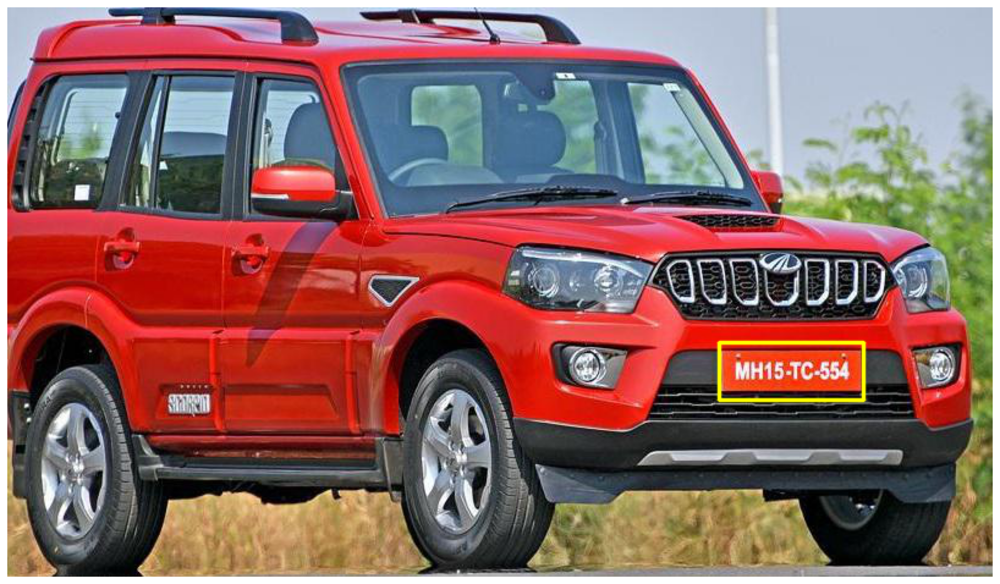

In [16]:
show_image_objects(df.iloc[0])

**We can see the annotation is correctly working**

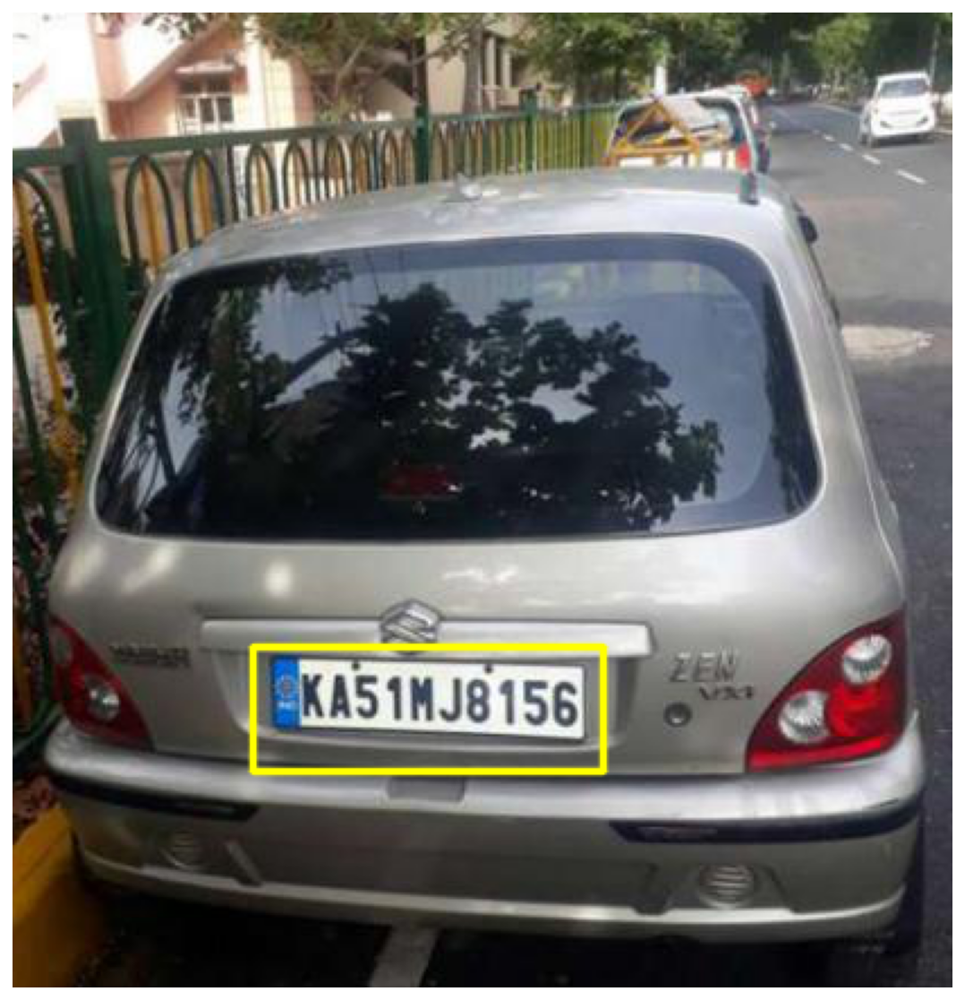

In [17]:
show_image_objects(df.iloc[5])

**Split train and test data by using keras utility function**

In [18]:
train_df, test_df = train_test_split(
  df, 
  test_size=0.2, 
  random_state=RANDOM_SEED
)

In [19]:
ANNOTATIONS_FILE = 'annotations.csv'
CLASSES_FILE = 'classes.csv'

In [20]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None)

In [21]:
classes = set(['license_plate'])

with open(CLASSES_FILE, 'w') as f:
  for i, line in enumerate(sorted(classes)):
    f.write('{},{}\n'.format(line,i))

In [22]:
!head classes.csv

license_plate,0


In [23]:
!head annotations.csv

number_plates/licensed_car_183.jpeg,169,260,358,298,license_plate
number_plates/licensed_car_201.jpeg,251,187,375,234,license_plate
number_plates/licensed_car_230.jpeg,140,149,324,220,license_plate
number_plates/licensed_car_95.jpeg,302,420,671,534,license_plate
number_plates/licensed_car_190.jpeg,115,86,227,117,license_plate
number_plates/licensed_car_84.jpeg,103,209,258,276,license_plate
number_plates/licensed_car_158.jpeg,83,34,369,483,license_plate
number_plates/licensed_car_97.jpeg,123,117,221,170,license_plate
number_plates/licensed_car_147.jpeg,162,227,312,274,license_plate
number_plates/licensed_car_184.jpeg,100,148,259,208,license_plate


**Now we will train our model. Here we user transfer learning**

In [24]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


**It can be possible to train a model by using the following block. It will take 10-15 hours to train a model.So, we didn't train a new model. We just give an example how one can train his/her own model**

In [25]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 8 --steps 500 --epochs 10 csv annotations.csv classes.csv

2020-09-22 15:23:39.275627: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Creating model, this may take a second...
2020-09-22 15:23:41.083417: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-22 15:23:41.129027: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-22 15:23:41.129937: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-09-22 15:23:41.129983: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-22 15:23:

In [26]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_01.h5  resnet50_csv_10.h5


**Here we check the traind model and select the pretrained model for further detection module**

In [27]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv(CLASSES_FILE, header=None).T.loc[0].to_dict()

snapshots/resnet50_csv_10.h5


**Here, predict function used to predict the boxes,score and labels and return the value**

In [28]:
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

**We put a threshold here so that if our model prediction score is less then 60% we won't do anything else we will draw the box and caption**

In [29]:
THRES_SCORE = 0.6

def draw_detections(image, boxes, scores, labels):
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < THRES_SCORE:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(image, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(image, b, caption)


**Above two function is used here to show detected object**

In [30]:
def show_detected_objects(image_row):
  img_path = image_row.image_name
  
  image = read_image_bgr(img_path)

  boxes, scores, labels = predict(image) #call the predict function above

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  true_box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]
  draw_box(draw, true_box, color=(255, 255, 0)) #call keras built-in function draw_box

  draw_detections(draw, boxes, scores, labels)  #call the draw_detection function

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

**Now we will check our model prediction by using our test data**

In [31]:
test_df.head(n=10) 

,image_name,x_min,y_min,x_max,y_max,class_name
115,number_plates/licensed_car_115.jpeg,48,74,599,188,license_plate
15,number_plates/licensed_car_15.jpeg,274,344,517,431,license_plate
211,number_plates/licensed_car_211.jpeg,157,89,382,160,license_plate
126,number_plates/licensed_car_126.jpeg,443,255,639,347,license_plate
6,number_plates/licensed_car_6.jpeg,227,241,444,315,license_plate
170,number_plates/licensed_car_170.jpeg,556,442,1746,1079,license_plate
9,number_plates/licensed_car_9.jpeg,674,365,958,572,license_plate
221,number_plates/licensed_car_221.jpeg,93,332,298,406,license_plate
112,number_plates/licensed_car_112.jpeg,22,50,499,362,license_plate
220,number_plates/licensed_car_220.jpeg,55,191,194,238,license_plate


**Here, We can see in the blue box that our model is predicted the number plate with 93% of confidence which is pretty good Because we use only 189 images to train this model**

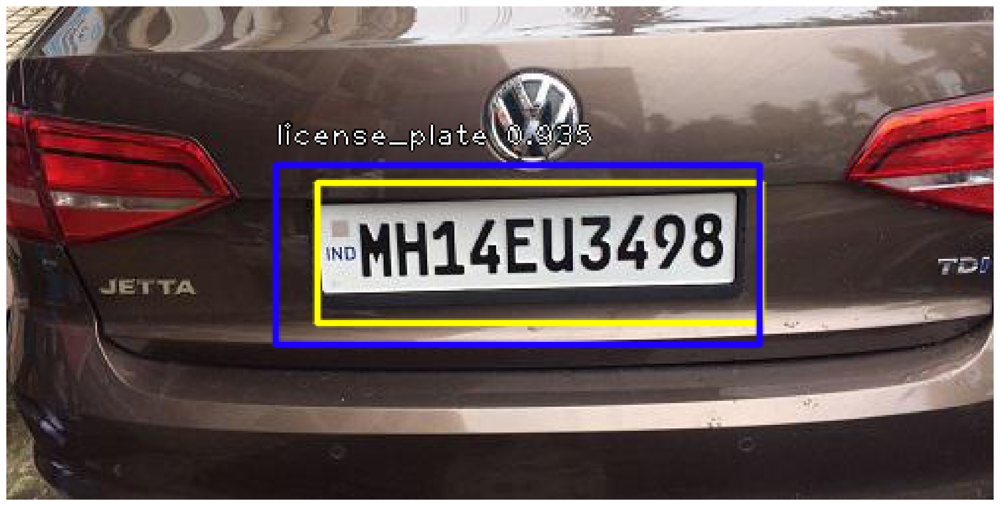

In [32]:
show_detected_objects(test_df.iloc[2])

**Our prediction confidence here is 83% and detect the number plate correctly**

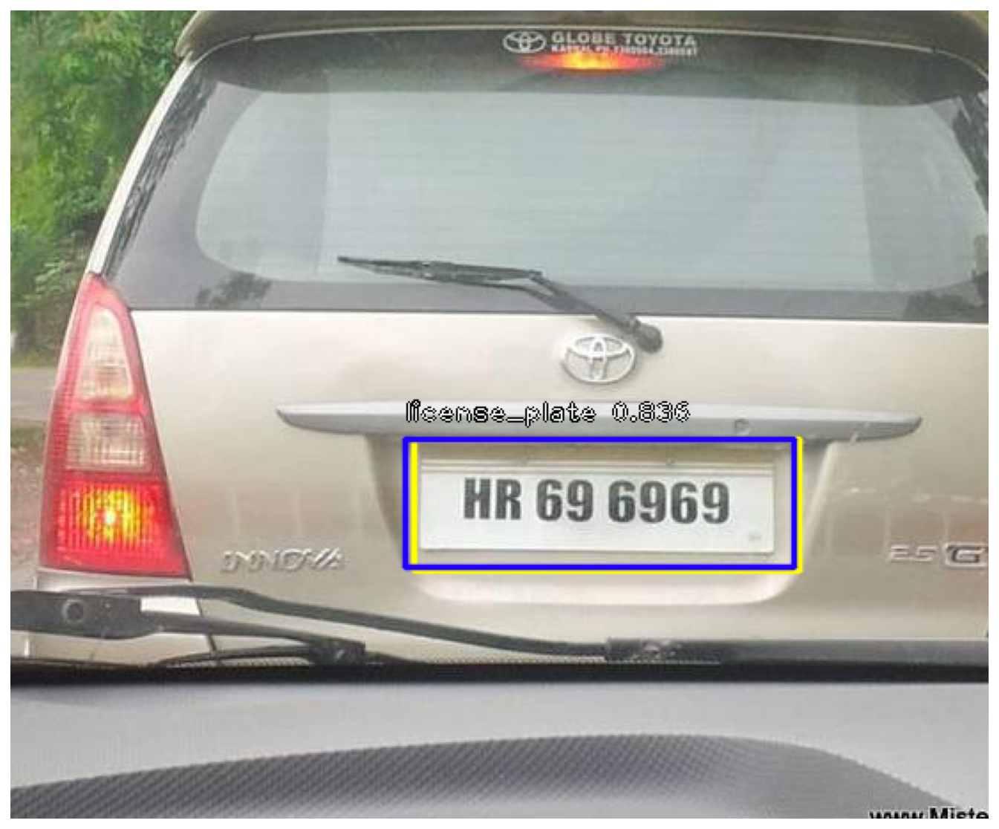

In [33]:
show_detected_objects(test_df.iloc[4])

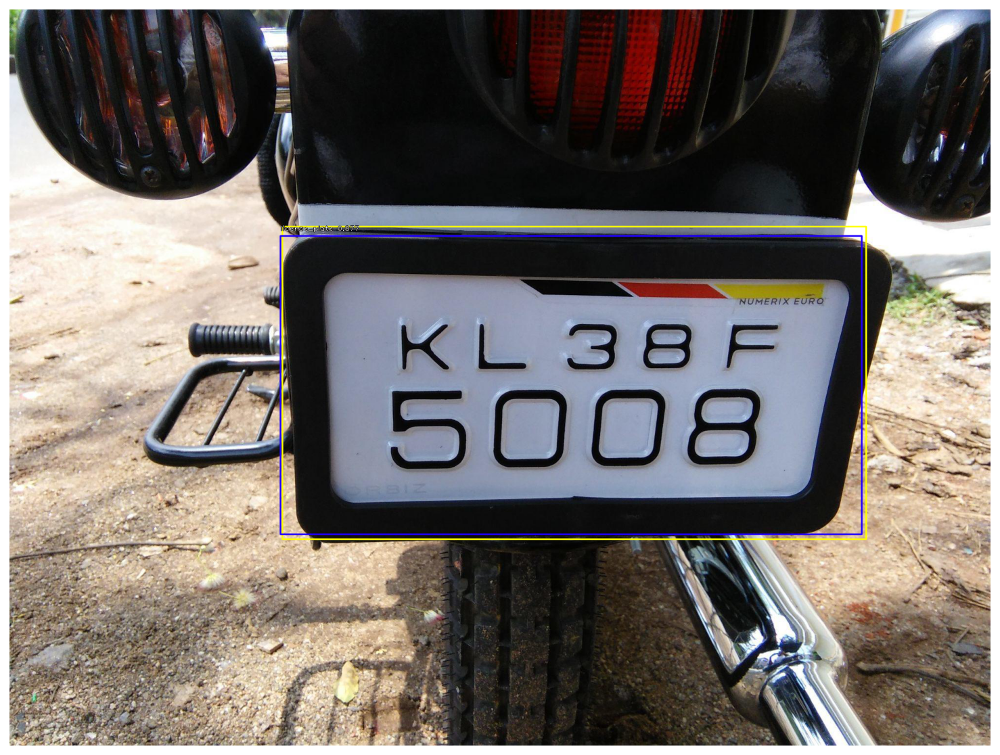

In [34]:
show_detected_objects(test_df.iloc[5])

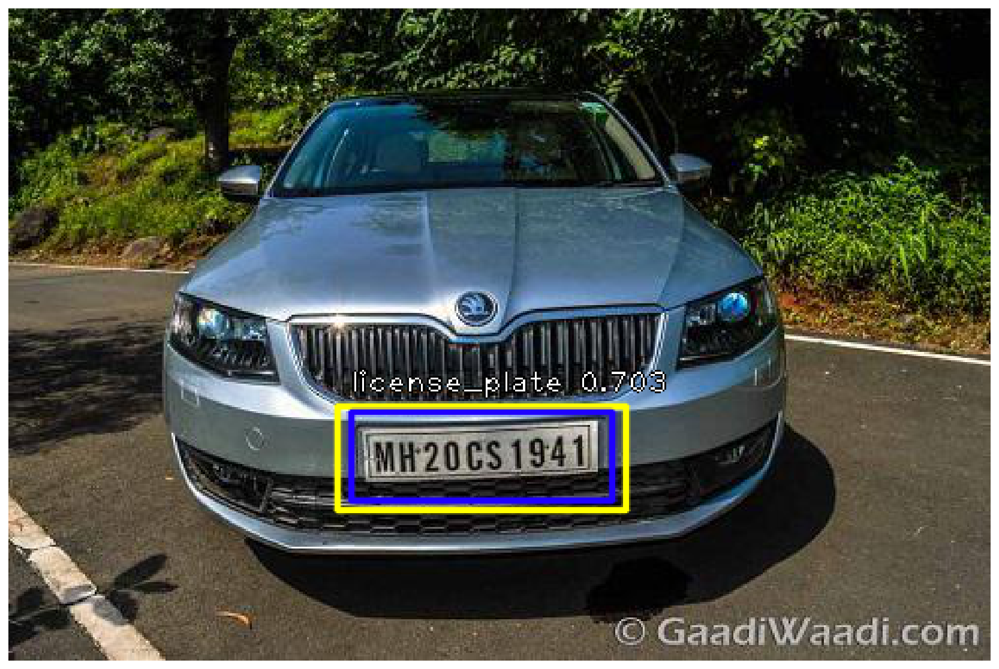

In [35]:
show_detected_objects(test_df.iloc[23])

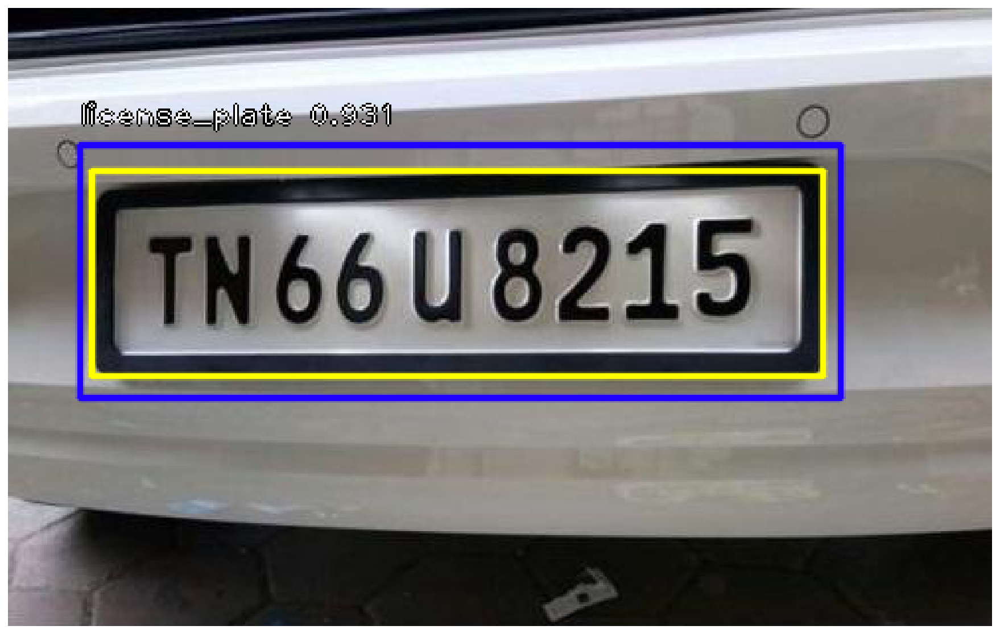

In [36]:
show_detected_objects(test_df.iloc[27])

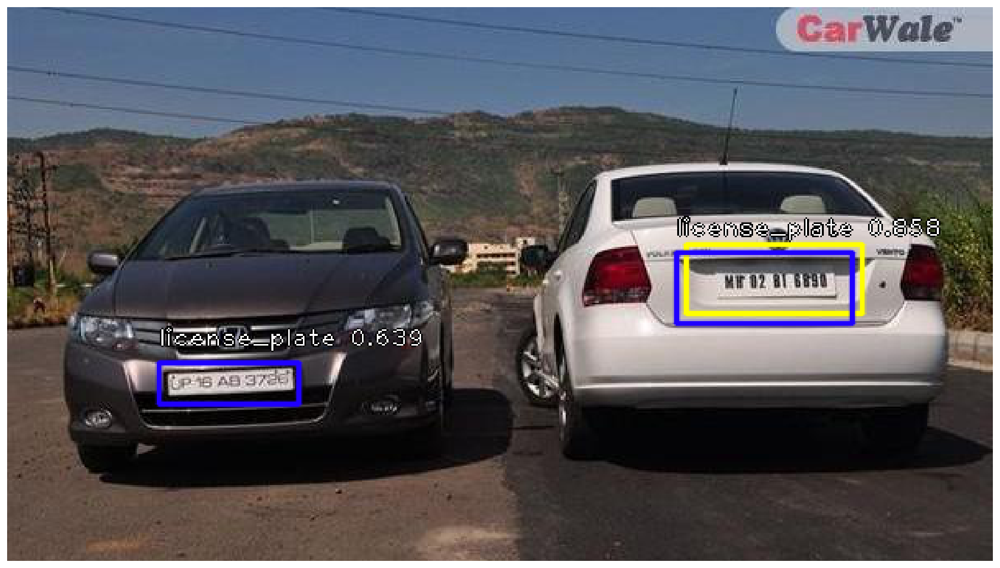

In [37]:
show_detected_objects(test_df.iloc[28])

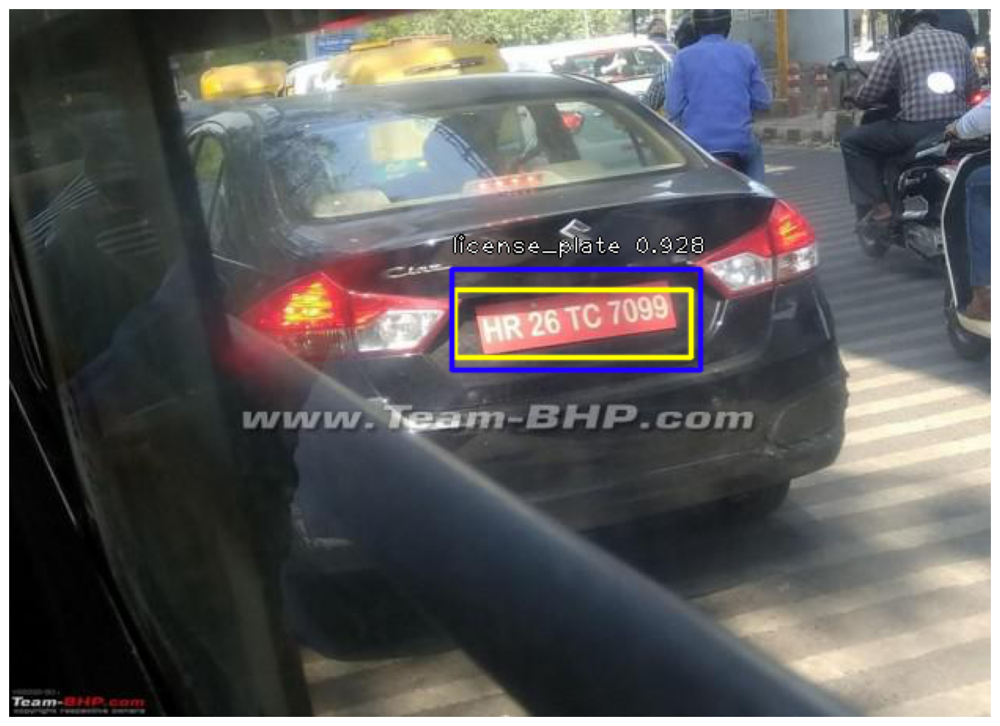

In [38]:
show_detected_objects(test_df.iloc[29])

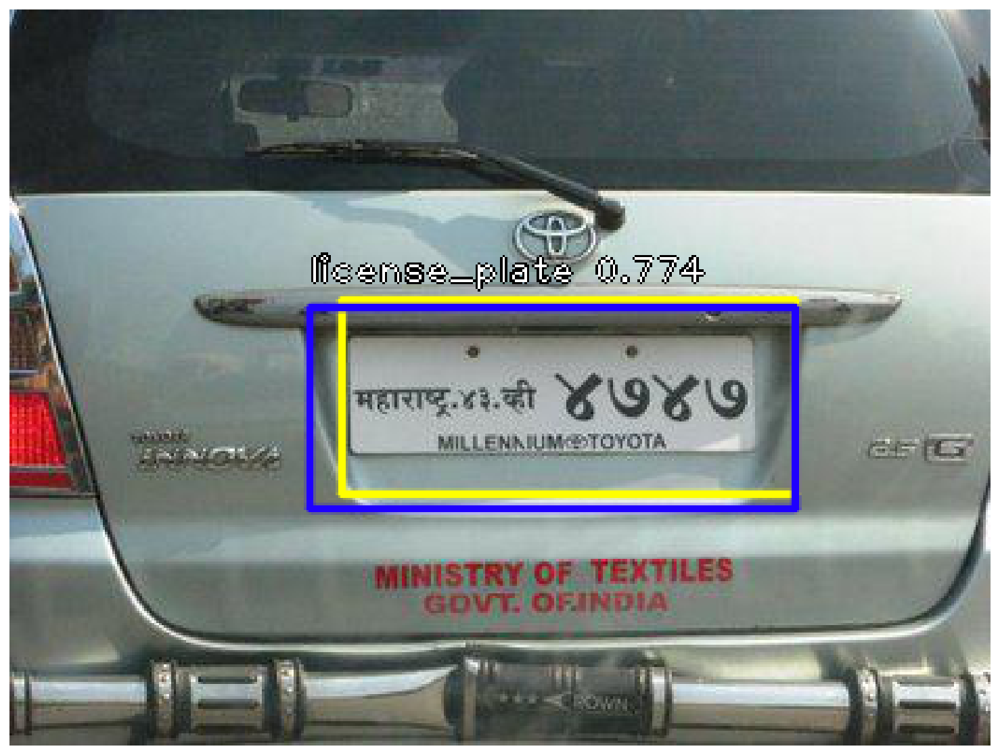

In [39]:
show_detected_objects(test_df.iloc[30])

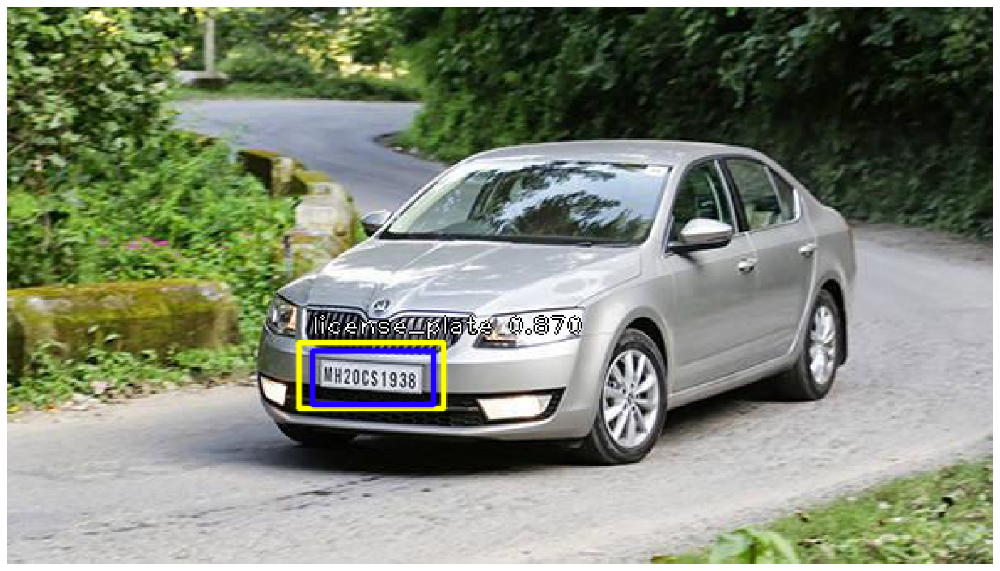

In [40]:
show_detected_objects(test_df.iloc[32])

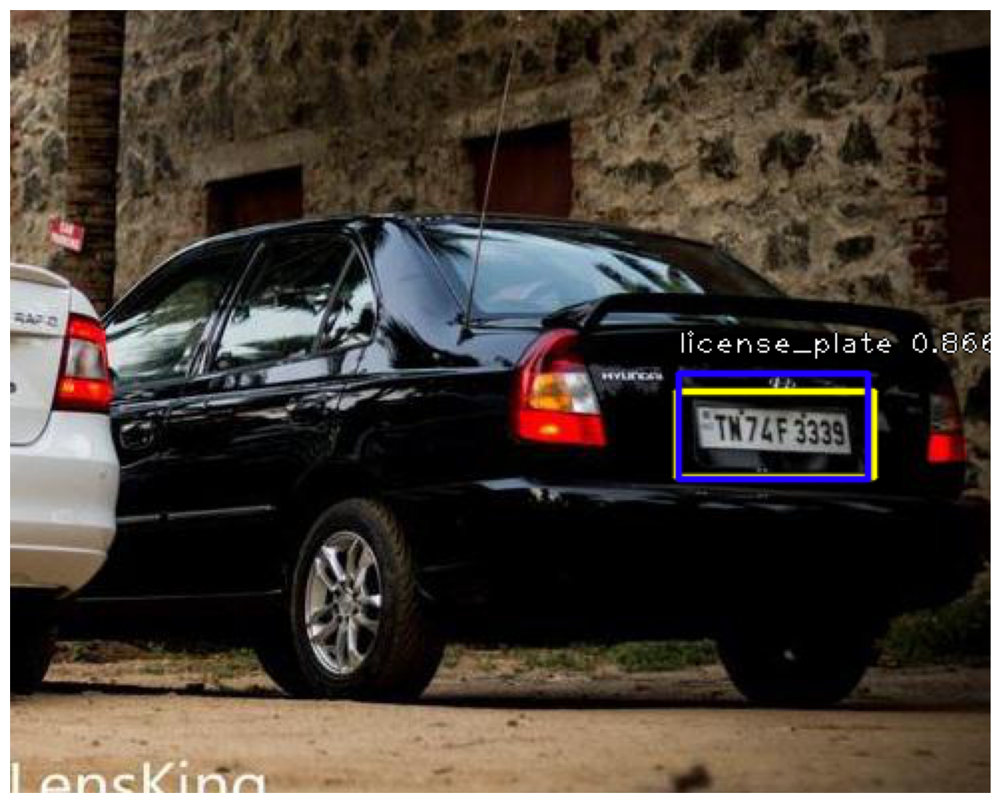

In [41]:
show_detected_objects(test_df.iloc[33])

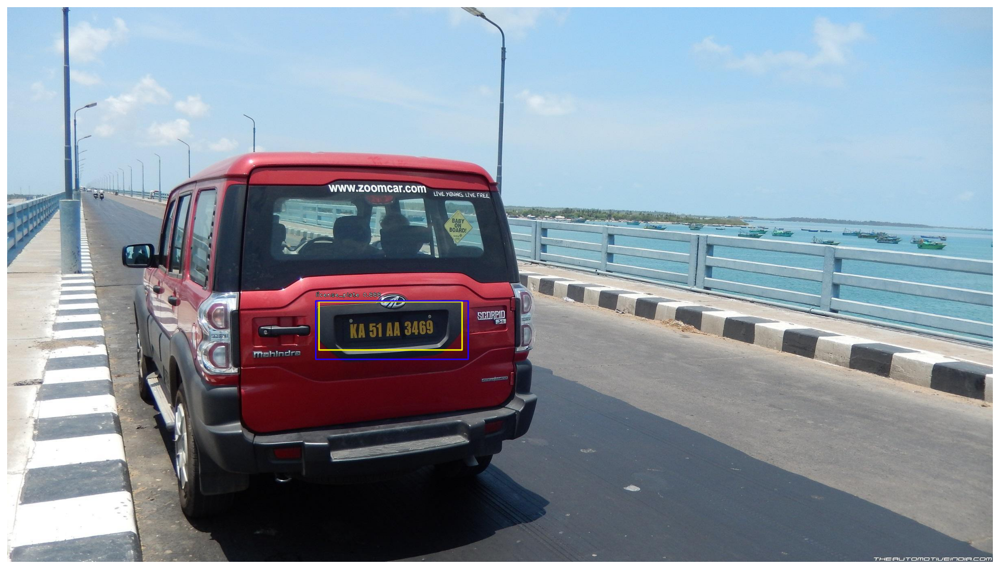

In [42]:
show_detected_objects(test_df.iloc[35])

# Future work:

   **We will train several models instead of using the pre-trained model. We will discriminate our train model and choose the best one. We do it by changing the epochs, step, and batch size. Another thing that would be done is Automatic number plate localization after detecting the number plate.**

# Conclusion:
**We use transfer learning in our project because in our dataset we have only 251 images. We train only 189 images in this project. It is nearly impossible to get expected accuracy without transfer learning. Transfer learning mainly used where the training dataset is not that much big but we need higher accuracy. We face some difficulties with the annotation file and format. After spending a lot of hours in this project we get a clear idea about annotation and how to handle the annotation while drawing the bounding box. Another thing is Keras Built-in function which helps us lot to build the project. Lot of work we have done only by calling Keras function. So it reduces our work.
Finally, we got our expected accuracy after doing a lot of hard work.**